* <i>(First Model) <b>Faster R-CNN with ResNeXt 101 Feature Pyramid Network</b> from detectron2 [1,2],</i>
* <i>(Second Model) <b>Faster R-CNN with ResNet-50 Feature Pyramid Network</b> from detectron2 [1,2],</i>

I have used the following methods.

* I have modified the official notebook [3],
* I downloaded COCO json files [4],


## My Another Projects
* [Chest X-Ray Classification w/ViT (F1 Score: 0.9)](https://www.kaggle.com/code/banddaniel/chest-x-ray-classification-w-vit-f1-score-0-9)
* [Mammals Classification w/Ensemble Deep Learning](https://www.kaggle.com/code/banddaniel/mammals-classification-w-ensemble-deep-learning)
* [Rice Classification w/Custom ResNet50 (ACC 85%)](https://www.kaggle.com/code/banddaniel/rice-classification-w-custom-resnet50-acc-85)
* [Lung Segmentation UNet w/SeparableConv (Dice:0.93)](https://www.kaggle.com/code/banddaniel/lung-segmentation-unet-w-separableconv-dice-0-93)


## References
1. Ren, S., He, K., Girshick, R., & Sun, J. (2015). Faster R-CNN: Towards Real-Time Object Detection with Region Proposal Networks (Version 3). arXiv. https://doi.org/10.48550/ARXIV.1506.01497
2. https://detectron2.readthedocs.io/en/latest/
3. https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5
4. https://universe.roboflow.com/lr-tdx/road-mark/dataset/3


In [1]:
import sys, os, distutils.core
from IPython.display import clear_output

!python -m pip install pyyaml==5.1
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))
clear_output()

In [2]:
# Importing dependencies

import torch, detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
print("detectron2 version:", detectron2.__version__)

import numpy as np
import os, json, cv2, random
from IPython import display
import PIL
import matplotlib.pyplot as plt

# importing detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog


SEED = 13
THRESHOLD = 0.75

detectron2 version: 0.6


In [3]:
# Creating coco instances

from detectron2.data.datasets import register_coco_instances
from detectron2.structures import BoxMode

for d in ["train", "valid", "test"]:
    register_coco_instances(f"road_marks_{d}", {},
                            f"../input/road-mark-detection-coco-annotations/{d}_annotations.coco.json",
                            f"../input/road-mark-detection/{d}/images")

In [4]:
# Examples from the training dataset

import random
from detectron2.utils.visualizer import Visualizer

my_dataset_train_metadata = MetadataCatalog.get("road_marks_train")
train_dataset_dicts = DatasetCatalog.get("road_marks_train")

# A function that creates examples from the dataset
def create_random_images(dataset_dict,dataset_metadata, seed, image_scale = 0.7):
    np.random.seed(seed)
    images = np.random.permutation(dataset_dict)[:2]
    
    fig, axs = plt.subplots(1,2, figsize = (12,6), dpi = 100)
    for i in range(2):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        vis = visualizer.draw_dataset_dict(im)
        final_img = vis.get_image()
        
        axs[i].set_title('image id: ' + str(img_id), fontsize = 10)
        axs[i].axis('off')
        axs[i].imshow(final_img)

WARNING [12/01 10:36:53 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/01 10:36:53 d2.data.datasets.coco]: Loaded 2167 images in COCO format from ../input/road-mark-detection-coco-annotations/train_annotations.coco.json


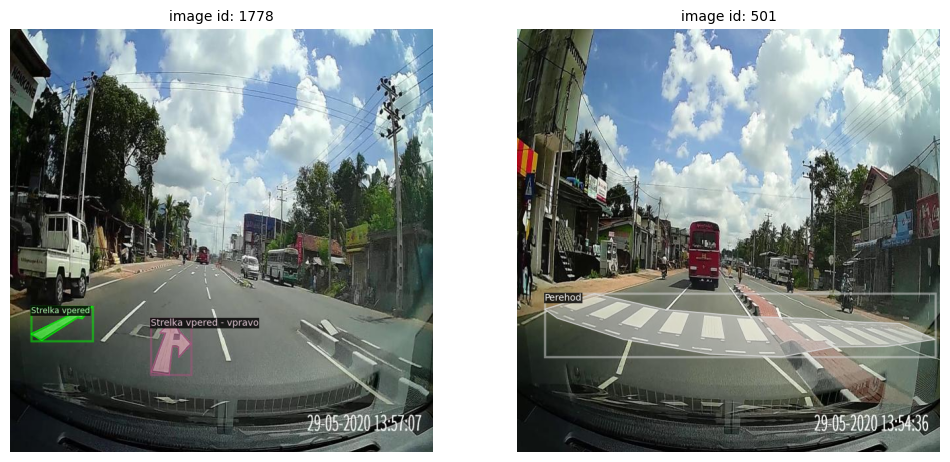

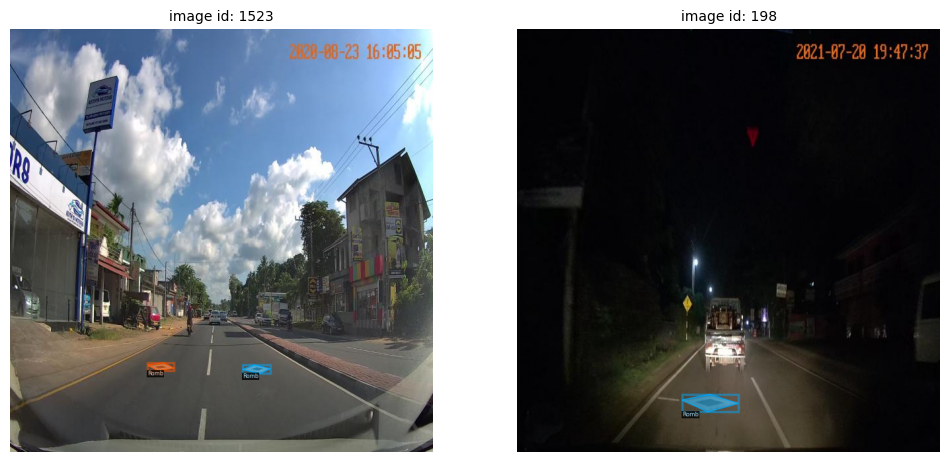

In [5]:
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 4 , image_scale = 1)
create_random_images(train_dataset_dicts, my_dataset_train_metadata, seed = 14 , image_scale = 1)

# <span style="color:#e74c3c;">Faster R-CNN w/ResNeXt 101 FPN </span> Model, Training

In [6]:
from detectron2.engine import DefaultTrainer

EPOCHS = 1800
NUM_CLASSES = 13
BASE_LR = 0.001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("road_marks_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR  
cfg.SOLVER.MAX_ITER = EPOCHS    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# uncomment below to train
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/01 10:36:59 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:02, 179MB/s]                           


[12/01 10:37:02 d2.engine.train_loop]: Starting training from iteration 0


/opt/conda/lib/python3.10/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /usr/local/src/pytorch/aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/01 10:37:25 d2.utils.events]:  eta: 0:19:34  iter: 19  total_loss: 3.499  loss_cls: 2.633  loss_box_reg: 0.002844  loss_rpn_cls: 0.7614  loss_rpn_loc: 0.07577    time: 0.6886  last_time: 0.7875  data_time: 0.0106  last_data_time: 0.0044   lr: 1.9981e-05  max_mem: 3909M


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


[12/01 10:37:52 d2.utils.events]:  eta: 0:19:20  iter: 39  total_loss: 2.513  loss_cls: 2.034  loss_box_reg: 0.02903  loss_rpn_cls: 0.2641  loss_rpn_loc: 0.1138    time: 0.7364  last_time: 0.6127  data_time: 0.0050  last_data_time: 0.0045   lr: 3.9961e-05  max_mem: 3909M
[12/01 10:38:06 d2.utils.events]:  eta: 0:19:25  iter: 59  total_loss: 1.314  loss_cls: 0.8908  loss_box_reg: 0.08348  loss_rpn_cls: 0.1397  loss_rpn_loc: 0.08621    time: 0.7249  last_time: 0.7897  data_time: 0.0055  last_data_time: 0.0057   lr: 5.9941e-05  max_mem: 3910M
[12/01 10:38:20 d2.utils.events]:  eta: 0:20:23  iter: 79  total_loss: 0.5599  loss_cls: 0.2696  loss_box_reg: 0.09633  loss_rpn_cls: 0.1272  loss_rpn_loc: 0.0502    time: 0.7210  last_time: 0.6178  data_time: 0.0051  last_data_time: 0.0057   lr: 7.9921e-05  max_mem: 3910M
[12/01 10:38:34 d2.utils.events]:  eta: 0:21:12  iter: 99  total_loss: 0.6964  loss_cls: 0.2393  loss_box_reg: 0.132  loss_rpn_cls: 0.1029  loss_rpn_loc: 0.1426    time: 0.7202  la

In [7]:
# Saving the model

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[12/01 10:58:32 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# <span style="color:#e74c3c;">Faster R-CNN w/ResNeXt 101 FPN </span> Training Results

In [8]:
# original code from https://eidos-ai.medium.com/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e

def reading_metrics_from_json(metrics_path):
    metrics = []
    
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        try:
            metric.append(metrics[i][specific_metric])
        except KeyError:
            pass

    return metric

In [9]:
train_metrics = reading_metrics_from_json('/kaggle/working/output/metrics.json')

total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
false_neg = metric(train_metrics, 'fast_rcnn/false_negative')
loss_box_reg = metric(train_metrics, 'loss_box_reg')
iters = np.arange(1,EPOCHS,EPOCHS/len(total_loss))

Text(0.5, 1.0, 'False Negative')

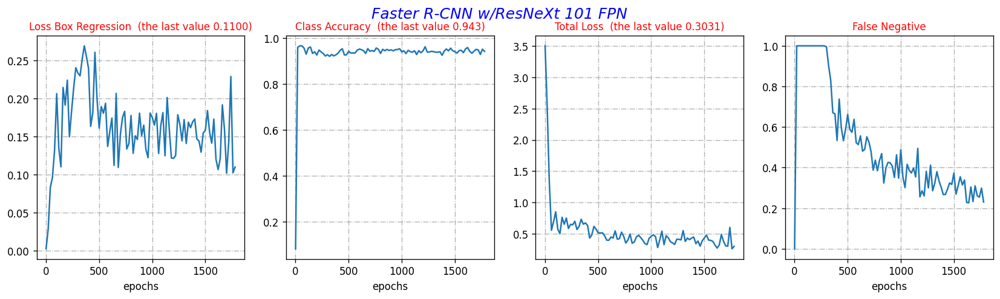

In [10]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)
fig.suptitle('Faster R-CNN w/ResNeXt 101 FPN', color = 'blue', fontsize=15,  style = "italic")

axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, false_neg)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('False Negative', fontsize = 10, color = 'red')

# <span style="color:#e74c3c;">Faster R-CNN w/ResNeXt 101 FPN </span> Test Results

In [11]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("road_marks_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "road_marks_test")
inference_on_dataset(trainer.model, test_loader, evaluator)

[12/01 10:58:34 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [12/01 10:58:34 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/01 10:58:34 d2.data.datasets.coco]: Loaded 192 images in COCO format from ../input/road-mark-detection-coco-annotations/test_annotations.coco.json
[12/01 10:58:34 d2.data.build]: Distribution of instances among all 14 categories:
|   category    | #instances   |   category    | #instances   |   category    | #instances   |
|:-------------:|:-------------|:-------------:|:-------------|:-------------:|:-------------|
|  road-marks   | 0            |   BUS LANE    | 24           | Jeltaya raz.. | 11           |
|   Liniya 1    | 635          |   Liniya 2    | 29           |    Perehod    | 51           |
|     Romb      | 48           |     SLOW      | 12           | Strelka vlevo | 21           |
| Strelka vpe.. | 113          | Strelka

OrderedDict([('bbox',
              {'AP': 31.924120325013618,
               'AP50': 52.843894949469586,
               'AP75': 35.21612854995015,
               'APs': 27.11920387532193,
               'APm': 33.148124918026085,
               'APl': 38.309925183157034,
               'AP-road-marks': nan,
               'AP-BUS LANE': 43.9679357120276,
               'AP-Jeltaya razmetka': 57.00671852899576,
               'AP-Liniya 1': 32.360606945631034,
               'AP-Liniya 2': 5.415469600920542,
               'AP-Perehod': 34.41721225888145,
               'AP-Romb': 49.95860409684841,
               'AP-SLOW': 11.666666666666666,
               'AP-Strelka vlevo': 19.329411036977103,
               'AP-Strelka vpered': 59.63600016997185,
               'AP-Strelka vpered - vlevo': 39.70639187092209,
               'AP-Strelka vpered - vpravo': 37.98184818481848,
               'AP-Strelka vpravo': 23.566699152515973,
               'AP-Velosiped': 0.0})])

# <span style="color:#e74c3c;">Faster R-CNN w/ResNeXt 101 FPN </span> Test Predictions

In [12]:
my_dataset_test_metadata = MetadataCatalog.get("road_marks_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("road_marks_test")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (10,20), dpi = 200)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox)

WARNING [12/01 10:58:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/01 10:58:59 d2.data.datasets.coco]: Loaded 192 images in COCO format from ../input/road-mark-detection-coco-annotations/test_annotations.coco.json


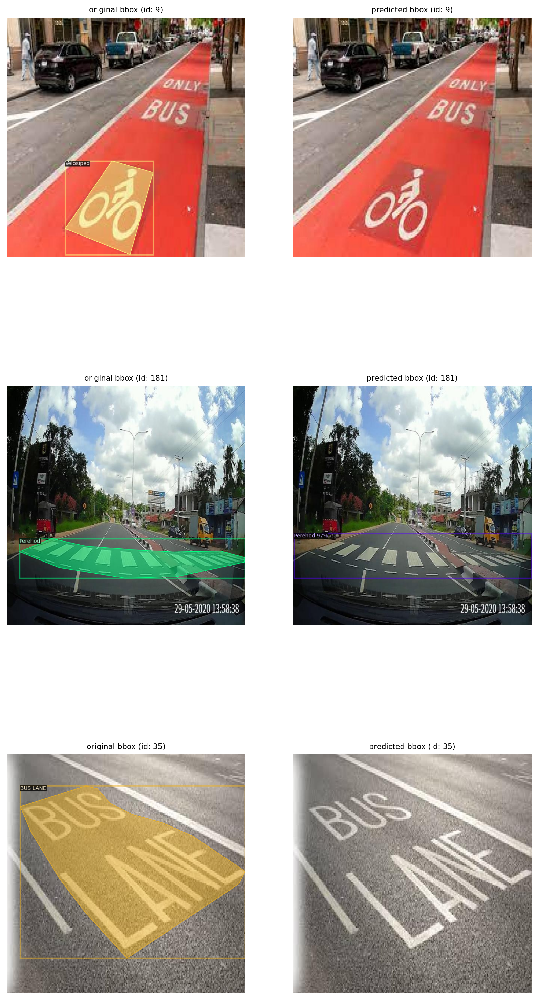

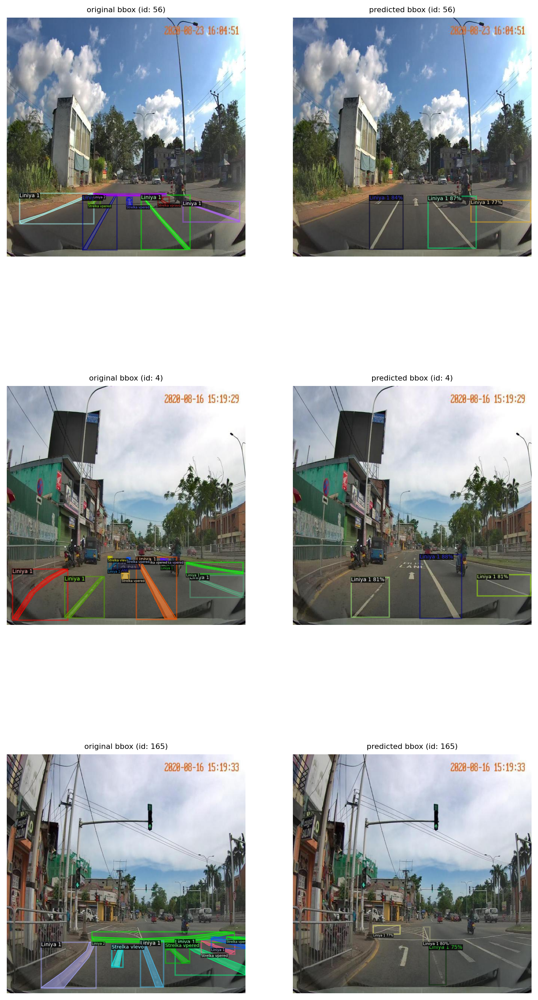

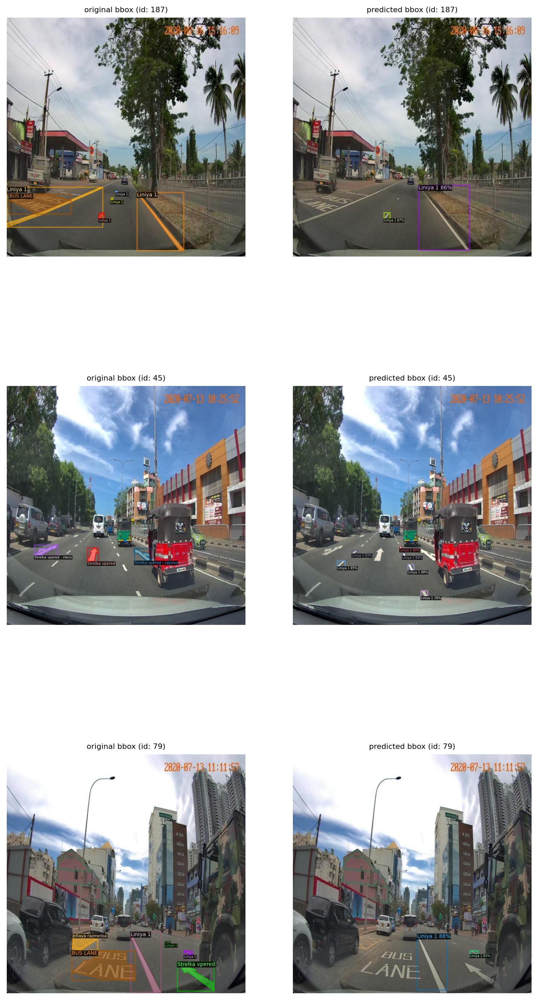

In [13]:
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 514, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 6, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 994, image_scale=1)

# <span style="color:#e74c3c;">Faster R-CNN w/ResNet-50 FPN </span> Model, Training

In [14]:
from detectron2.engine import DefaultTrainer

EPOCHS = 2500
NUM_CLASSES = 13
BASE_LR = 0.001

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("road_marks_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = BASE_LR  
cfg.SOLVER.MAX_ITER = EPOCHS    
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  
cfg.MODEL.ROI_HEADS.NUM_CLASSES = NUM_CLASSES

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# uncomment below to train
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/01 10:59:11 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_280758.pkl: 167MB [00:00, 201MB/s]                           


[12/01 10:59:12 d2.engine.train_loop]: Starting training from iteration 0
[12/01 10:59:16 d2.utils.events]:  eta: 0:07:45  iter: 19  total_loss: 3.941  loss_cls: 2.782  loss_box_reg: 0.009341  loss_rpn_cls: 0.8485  loss_rpn_loc: 0.2483    time: 0.1876  last_time: 0.1886  data_time: 0.0120  last_data_time: 0.0048   lr: 1.9981e-05  max_mem: 3914M
[12/01 10:59:20 d2.utils.events]:  eta: 0:07:43  iter: 39  total_loss: 2.611  loss_cls: 2.114  loss_box_reg: 0.02432  loss_rpn_cls: 0.2371  loss_rpn_loc: 0.05719    time: 0.1891  last_time: 0.1714  data_time: 0.0051  last_data_time: 0.0044   lr: 3.9961e-05  max_mem: 3914M
[12/01 10:59:24 d2.utils.events]:  eta: 0:07:40  iter: 59  total_loss: 1.428  loss_cls: 0.8536  loss_box_reg: 0.04219  loss_rpn_cls: 0.2346  loss_rpn_loc: 0.1238    time: 0.1898  last_time: 0.1883  data_time: 0.0050  last_data_time: 0.0055   lr: 5.9941e-05  max_mem: 3914M
[12/01 10:59:28 d2.utils.events]:  eta: 0:07:36  iter: 79  total_loss: 0.5442  loss_cls: 0.2121  loss_box_r

In [15]:
# Saving the model

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = THRESHOLD
predictor = DefaultPredictor(cfg)

import pickle
with open("cfg.pkl", "wb") as f:
    pickle.dump(cfg, f)

[12/01 11:07:15 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# <span style="color:#e74c3c;">Faster R-CNN w/ResNet-50 FPN </span> Training Results

In [16]:
# original code from https://eidos-ai.medium.com/training-on-detectron2-with-a-validation-set-and-plot-loss-on-it-to-avoid-overfitting-6449418fbf4e

def reading_metrics_from_json(metrics_path):
    metrics = []
    
    with open(metrics_path, 'r') as f:
        for line in f:
            metrics.append(json.loads(line))
    return metrics


def metric(metrics, specific_metric):
    metric = []
    for i in range(len(metrics)):
        try:
            metric.append(metrics[i][specific_metric])
        except KeyError:
            pass

    return metric

In [17]:
train_metrics = reading_metrics_from_json('/kaggle/working/output/metrics.json')

total_loss = metric(train_metrics, 'total_loss')
cls_acc = metric(train_metrics, 'fast_rcnn/cls_accuracy')
false_neg = metric(train_metrics, 'fast_rcnn/false_negative')
loss_box_reg = metric(train_metrics, 'loss_box_reg')
iters = np.arange(1,EPOCHS,EPOCHS/len(total_loss))

Text(0.5, 1.0, 'False Negative')

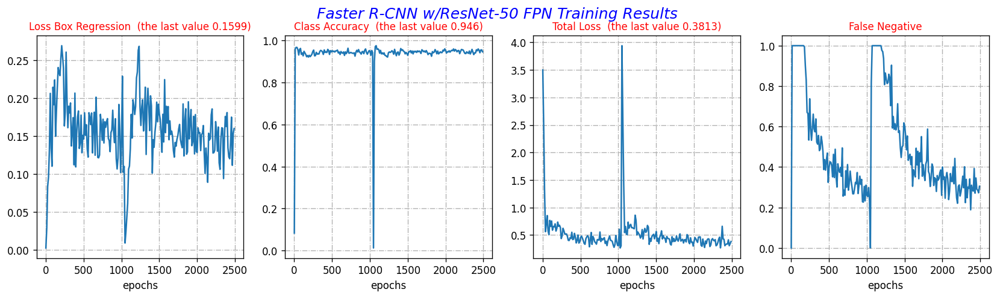

In [18]:
fig, axs = plt.subplots(1,4, figsize = (17, 4), dpi = 120)

fig.suptitle('Faster R-CNN w/ResNet-50 FPN Training Results', color = 'blue', fontsize=15,  style = "italic")

axs[0].grid(linestyle = 'dashdot')
axs[0].plot(iters, loss_box_reg)
axs[0].set_xlabel('epochs', fontsize = 10)
axs[0].set_title('Loss Box Regression', fontsize = 10)
tit0 = ' (the last value {0:.4f})'.format(loss_box_reg[-1])
axs[0].set_title('Loss Box Regression ' + tit0, fontsize = 10, color = 'red')

axs[1].grid(linestyle = 'dashdot')
axs[1].plot(iters, cls_acc)
axs[1].set_xlabel('epochs', fontsize = 10)
tit1 = ' (the last value {0:.3f})'.format(cls_acc[-1])
axs[1].set_title('Class Accuracy ' + tit1, fontsize = 10, color = 'red')

axs[2].grid(linestyle = 'dashdot')
axs[2].plot(iters, total_loss)
axs[2].set_xlabel('epochs', fontsize = 10)
tit2 = ' (the last value {0:.4f})'.format(total_loss[-1])
axs[2].set_title('Total Loss ' + tit2, fontsize = 10, color = 'red')

axs[3].grid(linestyle = 'dashdot')
axs[3].plot(iters, false_neg)
axs[3].set_xlabel('epochs', fontsize = 10)
axs[3].set_title('False Negative', fontsize = 10, color = 'red')

# <span style="color:#e74c3c;">Faster R-CNN w/ResNet-50 FPN </span> Test Results

In [19]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("road_marks_test", False, output_dir="./output/")
test_loader = build_detection_test_loader(cfg, "road_marks_test")
inference_on_dataset(trainer.model, test_loader, evaluator)

[12/01 11:07:18 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [12/01 11:07:18 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/01 11:07:18 d2.data.datasets.coco]: Loaded 192 images in COCO format from ../input/road-mark-detection-coco-annotations/test_annotations.coco.json
[12/01 11:07:18 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/01 11:07:18 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/01 11:07:18 d2.data.common]: Serializing 192 elements to byte tensors and concatenating them all ...
[12/01 11:07:18 d2.data.common]: Serialized dataset takes 0.23 MiB
[12/01 11:07:18 d2.evaluation.evaluator]: Start inference on 192 batches
[12/01 11:07:19 d2.evaluation.evaluator]: Inference done

OrderedDict([('bbox',
              {'AP': 33.477205627116945,
               'AP50': 56.726016399297464,
               'AP75': 33.43353253907922,
               'APs': 32.631687634587024,
               'APm': 34.91767052106163,
               'APl': 34.108294657188644,
               'AP-road-marks': nan,
               'AP-BUS LANE': 36.62247736859158,
               'AP-Jeltaya razmetka': 54.300330033003306,
               'AP-Liniya 1': 34.356700267763266,
               'AP-Liniya 2': 5.2037904010591784,
               'AP-Perehod': 36.803850019454174,
               'AP-Romb': 60.50053385828742,
               'AP-SLOW': 21.90880312521048,
               'AP-Strelka vlevo': 13.454065295875594,
               'AP-Strelka vpered': 62.136401027302604,
               'AP-Strelka vpered - vlevo': 49.05162518040871,
               'AP-Strelka vpered - vpravo': 21.12929427866817,
               'AP-Strelka vpravo': 39.7358022968958,
               'AP-Velosiped': 0.0})])

# <span style="color:#e74c3c;">Faster R-CNN w/ResNet-50 FPN </span> Test Predictions

In [20]:
my_dataset_test_metadata = MetadataCatalog.get("road_marks_test")
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("road_marks_test")


# A function for plotting an original image's bbox and predicted bbox
def create_predictions(dataset_dict, dataset_metadata, seed, image_scale = 0.8):
    np.random.seed(seed=seed)
    images = np.random.permutation(dataset_dict)[:3]
    
    fig, axs = plt.subplots(3,2, figsize = (10,20), dpi = 200)
    
    for i in range(3):
        im = images[i]
        img_link = im['file_name']
        img_id = im['image_id']
        img = cv2.imread(img_link)
        img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        visualizer1 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)

        vis_original = visualizer1.draw_dataset_dict(im)
        original_bbox = vis_original.get_image()
        
        visualizer2 = Visualizer(img, metadata= dataset_metadata, scale=image_scale)
        outputs = predictor(img)
        out = visualizer2.draw_instance_predictions(outputs["instances"].to("cpu"))
        out_img = cv2.cvtColor(out.get_image(), cv2.COLOR_BGR2RGB)
        final_bbox = cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB)
        
        axs[i][0].set_title('original bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][0].axis('off')
        axs[i][0].imshow(original_bbox)
        
        axs[i][1].set_title('predicted bbox (id: ' + str(img_id) +')', fontsize = 8)
        axs[i][1].axis('off')
        axs[i][1].imshow(final_bbox)

WARNING [12/01 11:07:30 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/01 11:07:30 d2.data.datasets.coco]: Loaded 192 images in COCO format from ../input/road-mark-detection-coco-annotations/test_annotations.coco.json


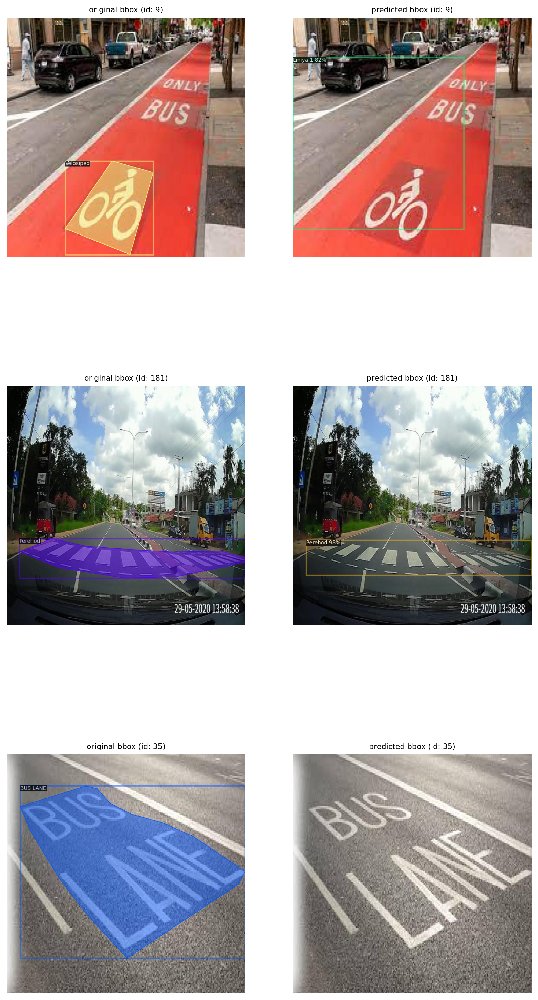

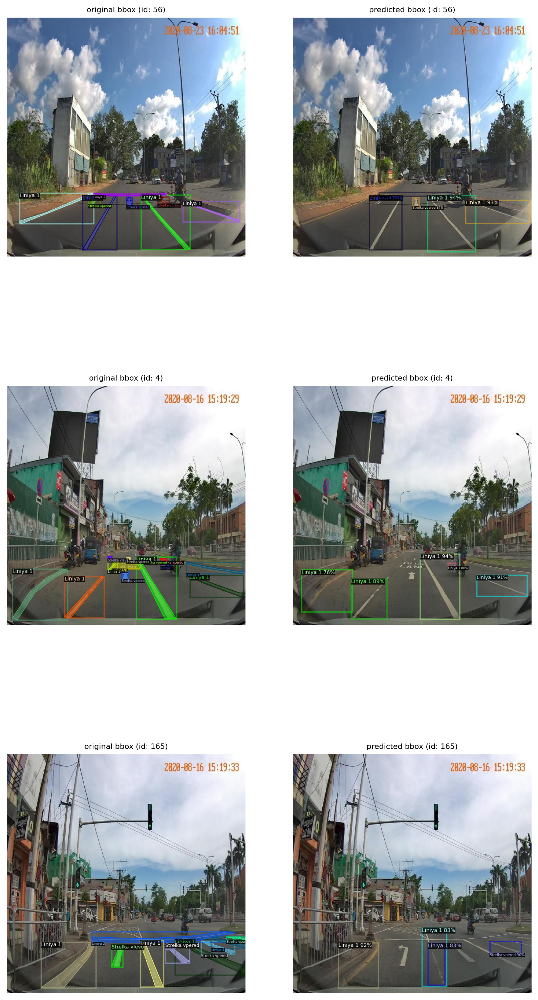

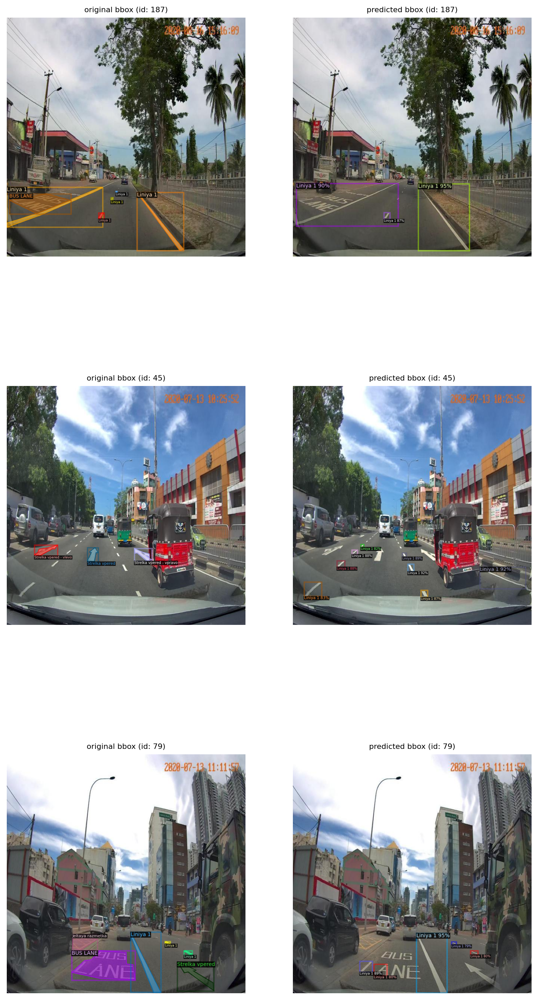

In [21]:
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 514, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 6, image_scale=1)
create_predictions(dataset_dicts,my_dataset_test_metadata,seed = 994, image_scale=1)